# Visualización y diagnóstico de las referencias FIRI–LMP para 13 configuraciones de suelo

Este notebook analiza el archivo consolidado generado para la ruta NAA–PLO con:

- 10 segmentos de guía de onda;
- 289 tiempos entre 2008-03-25 00:00 UTC y 2008-03-26 00:00 UTC;
- cadencia de 5 minutos;
- 10 casos homogéneos `GROUND[1]`–`GROUND[10]`;
- 3 casos mixtos, ordenados desde NAA hacia PLO:
  - `G10 × 5 → G7 × 5`;
  - `G10 × 6 → G7 × 4`;
  - `G10 × 7 → G7 × 3`.

La fase de cada caso fue desenvuelta **independientemente al final de la serie completa** mediante `DSP.unwrap`. No se aplicó alineamiento entre materiales.

El notebook:

1. audita dimensiones y metadatos;
2. grafica todas las series homogéneas;
3. compara los materiales de mayor conductividad y los tres casos mixtos;
4. calcula diferencias respecto de agua de mar homogénea (`GROUND[10]`);
5. estudia específicamente la ventana 18:00–22:00 UTC usada por la inversión Whittaker;
6. cuantifica si los casos mixtos se comportan como interpolaciones entre `GROUND[7]` y `GROUND[10]`;
7. revisa la continuidad temporal del `phase unwrap`.

In [1]:
################################################################################
# 1. Dependencias y rutas
################################################################################

using JLD2
using DataFrames
using Dates
using TimeZones
using Statistics
using LinearAlgebra
using DSP
using CSV
import CairoMakie as CM

const OUTPUT_DIR = joinpath(
    @__DIR__,
    "outputs_reference_efield_firi_10waveguides_13ground_cases_20080325",
)

const CONSOLIDATED_FILE = joinpath(
    OUTPUT_DIR,
    "reference_efield_firi_NAA_PLO_10wg_13ground_cases_20080325.jld2",
)

const FIGURE_DIR = joinpath(
    OUTPUT_DIR,
    "visualization_reference_efield_firi_13ground_cases",
)

isfile(CONSOLIDATED_FILE) || error(
    "No se encontró el archivo consolidado:\n$CONSOLIDATED_FILE\n\n" *
    "Coloca este notebook junto al directorio de outputs o modifica OUTPUT_DIR."
)

mkpath(FIGURE_DIR)

println("Archivo consolidado:")
println(CONSOLIDATED_FILE)
println("\nDirectorio de figuras y tablas:")
println(FIGURE_DIR)

Archivo consolidado:
/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/reference_efield_firi_NAA_PLO_10wg_13ground_cases_20080325.jld2

Directorio de figuras y tablas:
/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases


In [2]:
################################################################################
# 2. Carga robusta del archivo consolidado
################################################################################

data = JLD2.load(CONSOLIDATED_FILE)

case_keys = String.(vec(data["case_keys"]))
case_labels = String.(vec(data["case_labels"]))
case_types = String.(vec(data["case_types"]))
zdt = vec(data["zdt"])

N_CASES = length(case_keys)
N_TIMES = length(zdt)
N_WAVEGUIDES = Int(data["n_waveguides"])

function orient_case_time(M, ncases::Int, ntimes::Int, name::AbstractString)
    A = Array(M)

    if size(A) == (ncases, ntimes)
        return A
    elseif size(A) == (ntimes, ncases)
        return permutedims(A)
    else
        error(
            "$name tiene dimensiones $(size(A)); se esperaba " *
            "($ncases, $ntimes) o ($ntimes, $ncases)."
        )
    end
end

function orient_case_segment(M, ncases::Int, nsegments::Int, name::AbstractString)
    A = Array(M)

    if size(A) == (ncases, nsegments)
        return A
    elseif size(A) == (nsegments, ncases)
        return permutedims(A)
    else
        error(
            "$name tiene dimensiones $(size(A)); se esperaba " *
            "($ncases, $nsegments) o ($nsegments, $ncases)."
        )
    end
end

A_dB = Float64.(orient_case_time(
    data["amplitude_matrix_dB"],
    N_CASES,
    N_TIMES,
    "amplitude_matrix_dB",
))

phi_wrapped_rad = Float64.(orient_case_time(
    data["phase_wrapped_matrix_rad"],
    N_CASES,
    N_TIMES,
    "phase_wrapped_matrix_rad",
))

phi_unwrapped_rad = Float64.(orient_case_time(
    data["phase_unwrapped_matrix_rad"],
    N_CASES,
    N_TIMES,
    "phase_unwrapped_matrix_rad",
))

phi_unwrapped_deg = Float64.(orient_case_time(
    data["phase_unwrapped_matrix_deg"],
    N_CASES,
    N_TIMES,
    "phase_unwrapped_matrix_deg",
))

runtime_s = Float64.(orient_case_time(
    data["runtime_matrix_s"],
    N_CASES,
    N_TIMES,
    "runtime_matrix_s",
))

completed = Bool.(orient_case_time(
    data["completed_matrix"],
    N_CASES,
    N_TIMES,
    "completed_matrix",
))

ground_matrix = Int.(orient_case_segment(
    data["case_ground_matrix"],
    N_CASES,
    N_WAVEGUIDES,
    "case_ground_matrix",
))

all(completed) || error("Hay propagaciones incompletas.")
all(isfinite, A_dB) || error("La amplitud contiene NaN o Inf.")
all(isfinite, phi_wrapped_rad) || error("La fase wrapped contiene NaN o Inf.")
all(isfinite, phi_unwrapped_rad) || error("La fase unwrapped contiene NaN o Inf.")

OCEAN_INDEX = findfirst(==("ground_10"), case_keys)
GOOD_SOIL_INDEX = findfirst(==("ground_7"), case_keys)

OCEAN_INDEX === nothing && error("No se encontró ground_10.")
GOOD_SOIL_INDEX === nothing && error("No se encontró ground_7.")

t0 = DateTime(first(zdt))
t_hours = Dates.value.(DateTime.(zdt) .- t0) ./ 3_600_000

xtick_hours = collect(0.0:2.0:24.0)
xtick_labels = [
    Dates.format(t0 + Minute(round(Int, 60h)), "HH:MM")
    for h in xtick_hours
]

println("Casos: ", N_CASES)
println("Tiempos: ", N_TIMES)
println("Segmentos: ", N_WAVEGUIDES)
println("Primer tiempo: ", first(zdt))
println("Último tiempo:  ", last(zdt))

Casos: 13
Tiempos: 289
Segmentos: 10
Primer tiempo: 2008-03-25T00:00:00+00:00
Último tiempo:  2008-03-26T00:00:00+00:00


In [3]:
################################################################################
# 3. Auditoría de metadatos, configuración de los casos y del unwrapping
################################################################################

df_cases = DataFrame(
    case_index = 1:N_CASES,
    case_key = case_keys,
    case_label = case_labels,
    case_type = case_types,
    ground_indices_TX_to_RX = [
        join(ground_matrix[i, :], ",")
        for i in 1:N_CASES
    ],
)

df_metadata = DataFrame(
    quantity = [
        "Fecha UTC",
        "Transmisor",
        "Receptor",
        "Sampler del receptor",
        "Longitud de ruta [km]",
        "Número de segmentos",
        "Número de tiempos",
        "Cadencia [min]",
        "FIRI findex",
        "Incluye 00:00 del día siguiente",
        "Método de unwrapping",
        "Período del unwrap [rad]",
        "Alineamiento entre materiales",
        "SLURM job ID",
        "Generado en UTC",
    ],
    value = string.([
        data["date_UTC"],
        data["transmitter"],
        data["receiver"],
        data["receiver_sampler"],
        Float64(data["path_length_m"]) / 1e3,
        data["n_waveguides"],
        data["n_times"],
        data["cadence_minutes"],
        data["firi_findex"],
        Bool(data["includes_next_midnight"]),
        data["phase_unwrap_method"],
        data["phase_unwrap_period_rad"],
        Bool(data["phase_alignment_between_cases"]),
        data["slurm_job_id"],
        data["generated_at_UTC"],
    ]),
)

display(df_metadata)
display(df_cases)

@assert Int(data["n_times"]) == 289
@assert Int(data["n_waveguides"]) == 10
@assert Int(data["cadence_minutes"]) == 5
@assert Bool(data["phase_alignment_between_cases"]) == false
@assert size(ground_matrix) == (13, 10)

println("Auditoría básica superada.")

Row,quantity,value
,String,String
1,Fecha UTC,2008-03-25
2,Transmisor,NAA
3,Receptor,PLO
4,Sampler del receptor,rx12
5,Longitud de ruta [km],6399.376401510933
6,Número de segmentos,10
7,Número de tiempos,289
8,Cadencia [min],5
9,FIRI findex,75


Row,case_index,case_key,case_label,case_type,ground_indices_TX_to_RX
,Int64,String,String,String,String
1,1,ground_1,GROUND[1]: Ice / permafrost,homogeneous,"1,1,1,1,1,1,1,1,1,1"
2,2,ground_2,GROUND[2]: Intermediate LMP/LWPC class,homogeneous,"2,2,2,2,2,2,2,2,2,2"
3,3,ground_3,GROUND[3]: Poor soil / fresh water,homogeneous,"3,3,3,3,3,3,3,3,3,3"
4,4,ground_4,GROUND[4]: Intermediate LMP/LWPC class,homogeneous,"4,4,4,4,4,4,4,4,4,4"
5,5,ground_5,GROUND[5]: Average soil,homogeneous,"5,5,5,5,5,5,5,5,5,5"
6,6,ground_6,GROUND[6]: Intermediate LMP/LWPC class,homogeneous,"6,6,6,6,6,6,6,6,6,6"
7,7,ground_7,GROUND[7]: Clay / good soil,homogeneous,"7,7,7,7,7,7,7,7,7,7"
8,8,ground_8,GROUND[8]: Intermediate LMP/LWPC class,homogeneous,"8,8,8,8,8,8,8,8,8,8"
9,9,ground_9,GROUND[9]: Marine sands,homogeneous,"9,9,9,9,9,9,9,9,9,9"


Auditoría básica superada.


In [4]:
################################################################################
# 4. Verificación independiente de DSP.unwrap
################################################################################

phi_unwrapped_recomputed = similar(phi_unwrapped_rad)

for i in 1:N_CASES
    phi_unwrapped_recomputed[i, :] .= Float64.(DSP.unwrap(
        collect(@view phi_wrapped_rad[i, :]);
        dims = 1,
        discont = π,
        period = 2π,
    ))
end

max_unwrap_difference_rad = maximum(abs.(
    phi_unwrapped_recomputed .- phi_unwrapped_rad
))

println(
    "Máxima diferencia entre el unwrap guardado y el recalculado: ",
    max_unwrap_difference_rad,
    " rad",
)

max_unwrap_difference_rad <= 1e-12 || error(
    "La fase guardada no coincide con DSP.unwrap aplicado a la serie completa."
)

Máxima diferencia entre el unwrap guardado y el recalculado: 0.0 rad


true

In [5]:
################################################################################
# 5. Estilos gráficos y funciones auxiliares
################################################################################

homogeneous_keys = ["ground_$i" for i in 1:10]
mixed_keys = [
    "ocean5_goodsoil5",
    "ocean6_goodsoil4",
    "ocean7_goodsoil3",
]

high_conductivity_keys = [
    "ground_7",
    "ground_8",
    "ground_9",
    "ground_10",
]

comparison_keys = vcat(high_conductivity_keys, mixed_keys)

homogeneous_palette = CM.cgrad(:viridis, 10, categorical=true)

case_color = Dict{String, Any}()
for (i, key) in enumerate(homogeneous_keys)
    case_color[key] = homogeneous_palette[i]
end

case_color["ocean5_goodsoil5"] = :firebrick
case_color["ocean6_goodsoil4"] = :darkorange
case_color["ocean7_goodsoil3"] = :black

case_linestyle = Dict(
    "ocean5_goodsoil5" => :dash,
    "ocean6_goodsoil4" => :dashdot,
    "ocean7_goodsoil3" => :dot,
)

case_display = Dict(
    "ground_1" => "G1",
    "ground_2" => "G2",
    "ground_3" => "G3",
    "ground_4" => "G4",
    "ground_5" => "G5",
    "ground_6" => "G6",
    "ground_7" => "G7 — buen suelo",
    "ground_8" => "G8",
    "ground_9" => "G9",
    "ground_10" => "G10 — agua de mar",
    "ocean5_goodsoil5" => "G10×5 → G7×5",
    "ocean6_goodsoil4" => "G10×6 → G7×4",
    "ocean7_goodsoil3" => "G10×7 → G7×3",
)

case_index(key::AbstractString) = begin
    i = findfirst(==(key), case_keys)
    i === nothing && error("Caso desconocido: $key")
    i
end

function save_both(fig, basename::AbstractString)
    png = joinpath(FIGURE_DIR, basename * ".png")
    pdf = joinpath(FIGURE_DIR, basename * ".pdf")
    CM.save(png, fig)
    CM.save(pdf, fig)
    return (png=png, pdf=pdf)
end

function add_case_line!(
    ax,
    x,
    y,
    key;
    linewidth = 2.3,
    label = case_display[key],
)
    return CM.lines!(
        ax,
        x,
        y;
        color = case_color[key],
        linestyle = get(case_linestyle, key, :solid),
        linewidth = linewidth,
        label = label,
    )
end

add_case_line! (generic function with 1 method)

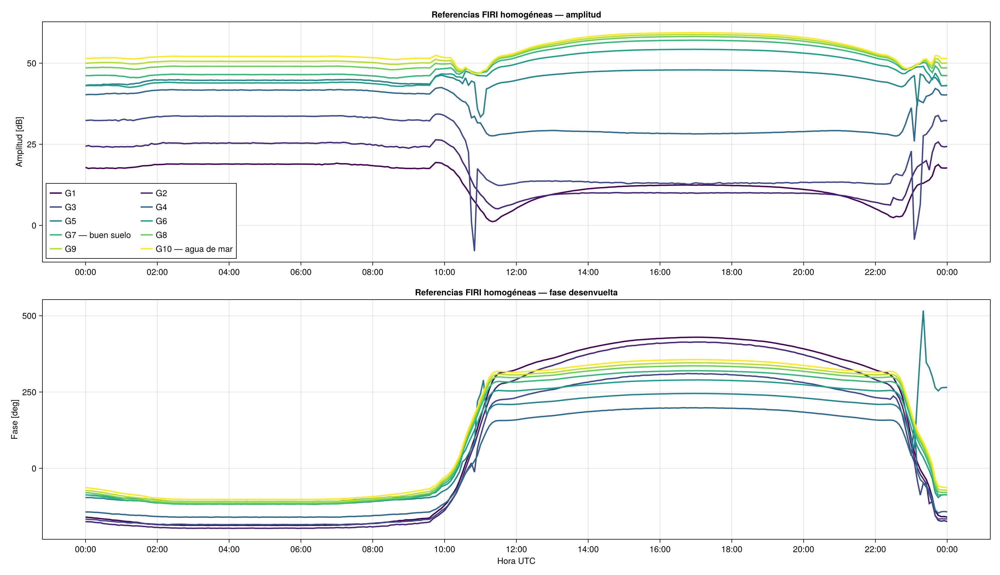

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/01_homogeneous_ground_reference_series.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/01_homogeneous_ground_reference_series.pdf")

In [6]:
################################################################################
# 6. Series completas de los diez materiales homogéneos
################################################################################

fig_homogeneous = CM.Figure(size=(1650, 950))

ax_hom_A = CM.Axis(
    fig_homogeneous[1, 1],
    title = "Referencias FIRI homogéneas — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_hours, xtick_labels),
)

for key in homogeneous_keys
    i = case_index(key)
    add_case_line!(ax_hom_A, t_hours, A_dB[i, :], key)
end

CM.axislegend(ax_hom_A, position=:lb, nbanks=2)

ax_hom_phi = CM.Axis(
    fig_homogeneous[2, 1],
    title = "Referencias FIRI homogéneas — fase desenvuelta",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_hours, xtick_labels),
)

for key in homogeneous_keys
    i = case_index(key)
    add_case_line!(ax_hom_phi, t_hours, phi_unwrapped_deg[i, :], key)
end

CM.linkxaxes!(ax_hom_A, ax_hom_phi)
CM.xlims!(ax_hom_A, 0, 24)

paths_homogeneous = save_both(
    fig_homogeneous,
    "01_homogeneous_ground_reference_series",
)

display(fig_homogeneous)
paths_homogeneous

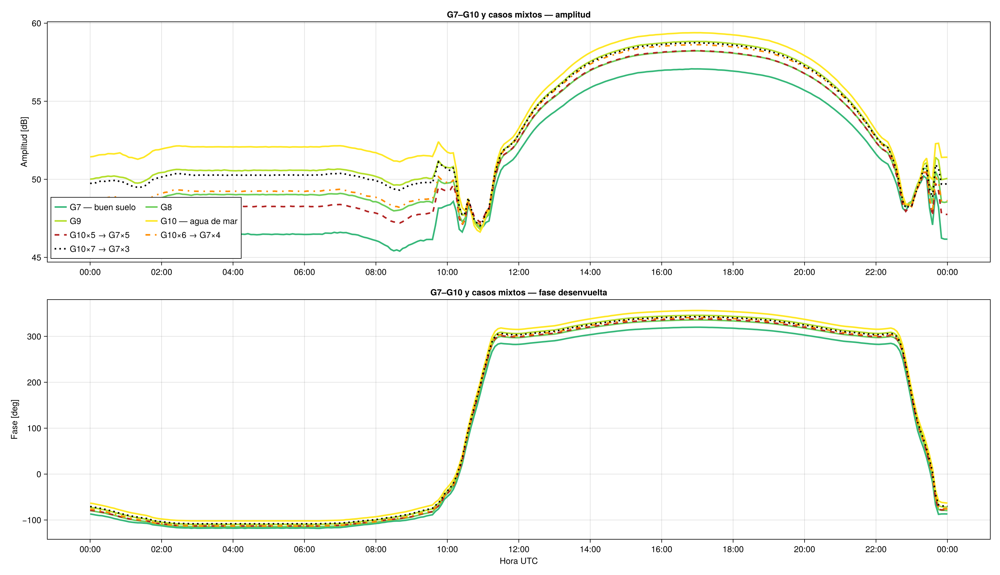

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/02_high_conductivity_and_mixed_reference_series.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/02_high_conductivity_and_mixed_reference_series.pdf")

In [7]:
################################################################################
# 7. Materiales de alta conductividad y casos mixtos
################################################################################

fig_relevant = CM.Figure(size=(1650, 950))

ax_rel_A = CM.Axis(
    fig_relevant[1, 1],
    title = "G7–G10 y casos mixtos — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_hours, xtick_labels),
)

for key in comparison_keys
    i = case_index(key)
    add_case_line!(ax_rel_A, t_hours, A_dB[i, :], key; linewidth=2.6)
end

CM.axislegend(ax_rel_A, position=:lb, nbanks=2)

ax_rel_phi = CM.Axis(
    fig_relevant[2, 1],
    title = "G7–G10 y casos mixtos — fase desenvuelta",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_hours, xtick_labels),
)

for key in comparison_keys
    i = case_index(key)
    add_case_line!(
        ax_rel_phi,
        t_hours,
        phi_unwrapped_deg[i, :],
        key;
        linewidth=2.6,
    )
end

CM.linkxaxes!(ax_rel_A, ax_rel_phi)
CM.xlims!(ax_rel_A, 0, 24)

paths_relevant = save_both(
    fig_relevant,
    "02_high_conductivity_and_mixed_reference_series",
)

display(fig_relevant)
paths_relevant

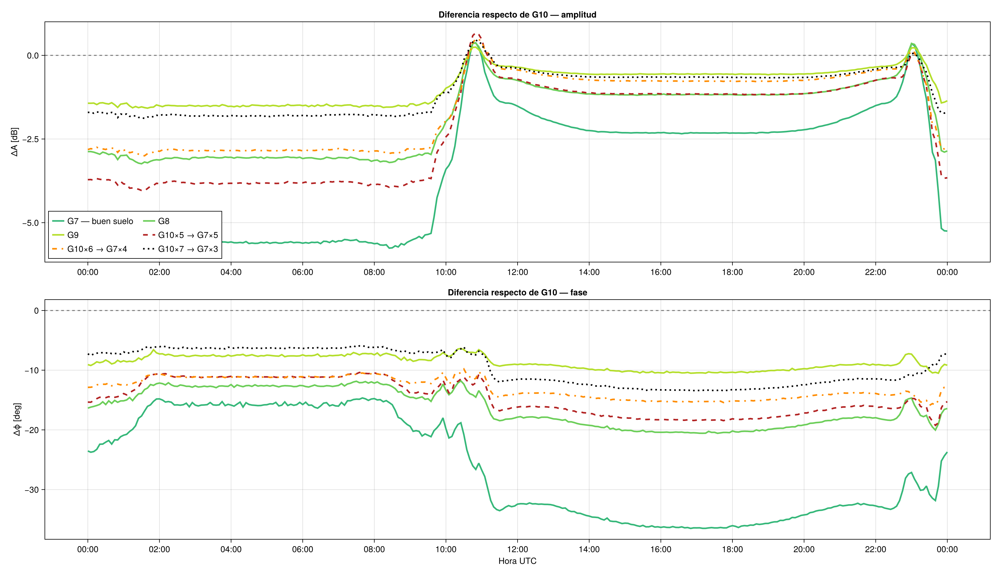

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/03_differences_relative_to_homogeneous_seawater.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/03_differences_relative_to_homogeneous_seawater.pdf")

In [8]:
################################################################################
# 8. Diferencias respecto del caso homogéneo de agua de mar
################################################################################

ocean_A = vec(A_dB[OCEAN_INDEX, :])
ocean_phi_deg = vec(phi_unwrapped_deg[OCEAN_INDEX, :])

delta_A_vs_ocean = A_dB .- reshape(ocean_A, 1, :)
delta_phi_vs_ocean_deg =
    phi_unwrapped_deg .- reshape(ocean_phi_deg, 1, :)

fig_delta = CM.Figure(size=(1650, 950))

ax_delta_A = CM.Axis(
    fig_delta[1, 1],
    title = "Diferencia respecto de G10 — amplitud",
    ylabel = "ΔA [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(ax_delta_A, [0.0], color=:gray45, linestyle=:dash)

for key in comparison_keys
    key == "ground_10" && continue
    i = case_index(key)
    add_case_line!(
        ax_delta_A,
        t_hours,
        delta_A_vs_ocean[i, :],
        key;
        linewidth=2.6,
    )
end

CM.axislegend(ax_delta_A, position=:lb, nbanks=2)

ax_delta_phi = CM.Axis(
    fig_delta[2, 1],
    title = "Diferencia respecto de G10 — fase",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(ax_delta_phi, [0.0], color=:gray45, linestyle=:dash)

for key in comparison_keys
    key == "ground_10" && continue
    i = case_index(key)
    add_case_line!(
        ax_delta_phi,
        t_hours,
        delta_phi_vs_ocean_deg[i, :],
        key;
        linewidth=2.6,
    )
end

CM.linkxaxes!(ax_delta_A, ax_delta_phi)
CM.xlims!(ax_delta_A, 0, 24)

paths_delta = save_both(
    fig_delta,
    "03_differences_relative_to_homogeneous_seawater",
)

display(fig_delta)
paths_delta

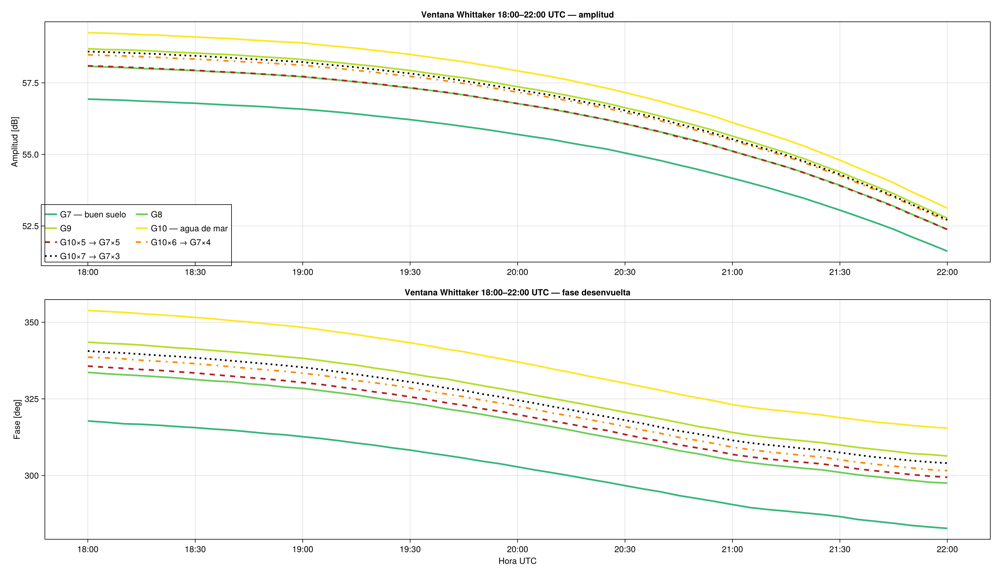

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/04_whittaker_window_18_22_absolute_series.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/04_whittaker_window_18_22_absolute_series.pdf")

In [9]:
################################################################################
# 9. Zoom en la ventana 18:00–22:00 UTC de la inversión Whittaker
################################################################################

window_start = ZonedDateTime(2008, 3, 25, 18, 0, 0, tz"UTC")
window_stop = ZonedDateTime(2008, 3, 25, 22, 0, 0, tz"UTC")

idx_18_22 = findall(t -> window_start <= t <= window_stop, zdt)
isempty(idx_18_22) && error("No se encontró la ventana 18:00–22:00 UTC.")

t_hours_18_22 = t_hours[idx_18_22]

xtick_18_22 = collect(18.0:0.5:22.0)
xtick_labels_18_22 = [
    Dates.format(t0 + Minute(round(Int, 60h)), "HH:MM")
    for h in xtick_18_22
]

fig_zoom = CM.Figure(size=(1650, 950))

ax_zoom_A = CM.Axis(
    fig_zoom[1, 1],
    title = "Ventana Whittaker 18:00–22:00 UTC — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_18_22, xtick_labels_18_22),
)

for key in comparison_keys
    i = case_index(key)
    add_case_line!(
        ax_zoom_A,
        t_hours_18_22,
        A_dB[i, idx_18_22],
        key;
        linewidth=2.8,
    )
end

CM.axislegend(ax_zoom_A, position=:lb, nbanks=2)

ax_zoom_phi = CM.Axis(
    fig_zoom[2, 1],
    title = "Ventana Whittaker 18:00–22:00 UTC — fase desenvuelta",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_18_22, xtick_labels_18_22),
)

for key in comparison_keys
    i = case_index(key)
    add_case_line!(
        ax_zoom_phi,
        t_hours_18_22,
        phi_unwrapped_deg[i, idx_18_22],
        key;
        linewidth=2.8,
    )
end

CM.linkxaxes!(ax_zoom_A, ax_zoom_phi)
CM.xlims!(ax_zoom_A, 18, 22)

paths_zoom = save_both(
    fig_zoom,
    "04_whittaker_window_18_22_absolute_series",
)

display(fig_zoom)
paths_zoom

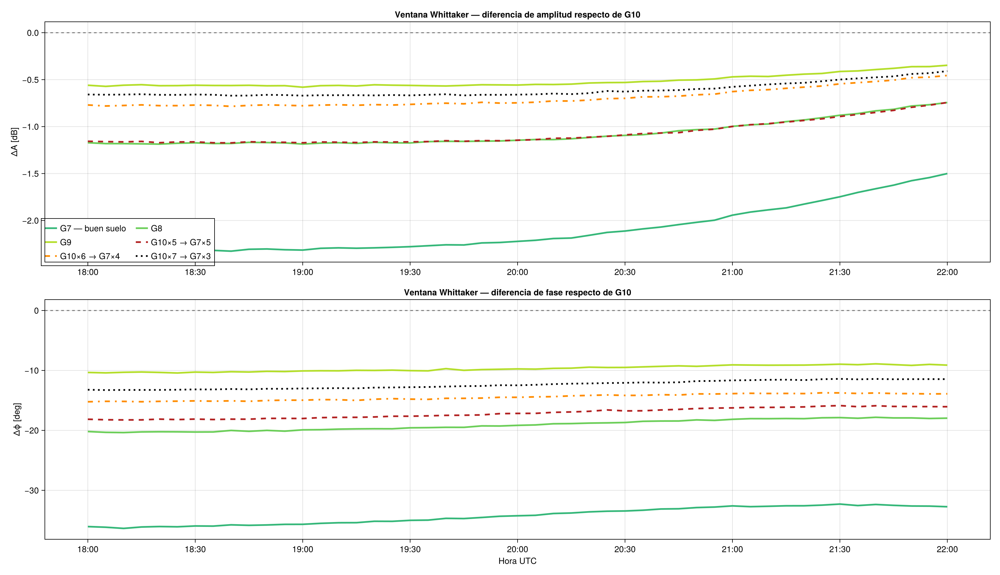

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/05_whittaker_window_18_22_differences_vs_seawater.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/05_whittaker_window_18_22_differences_vs_seawater.pdf")

In [10]:
################################################################################
# 10. Diferencias respecto de agua de mar en 18:00–22:00 UTC
################################################################################

fig_zoom_delta = CM.Figure(size=(1650, 950))

ax_zoom_delta_A = CM.Axis(
    fig_zoom_delta[1, 1],
    title = "Ventana Whittaker — diferencia de amplitud respecto de G10",
    ylabel = "ΔA [dB]",
    xticks = (xtick_18_22, xtick_labels_18_22),
)

CM.hlines!(ax_zoom_delta_A, [0.0], color=:gray45, linestyle=:dash)

for key in comparison_keys
    key == "ground_10" && continue
    i = case_index(key)
    add_case_line!(
        ax_zoom_delta_A,
        t_hours_18_22,
        delta_A_vs_ocean[i, idx_18_22],
        key;
        linewidth=2.8,
    )
end

CM.axislegend(ax_zoom_delta_A, position=:lb, nbanks=2)

ax_zoom_delta_phi = CM.Axis(
    fig_zoom_delta[2, 1],
    title = "Ventana Whittaker — diferencia de fase respecto de G10",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = (xtick_18_22, xtick_labels_18_22),
)

CM.hlines!(ax_zoom_delta_phi, [0.0], color=:gray45, linestyle=:dash)

for key in comparison_keys
    key == "ground_10" && continue
    i = case_index(key)
    add_case_line!(
        ax_zoom_delta_phi,
        t_hours_18_22,
        delta_phi_vs_ocean_deg[i, idx_18_22],
        key;
        linewidth=2.8,
    )
end

CM.linkxaxes!(ax_zoom_delta_A, ax_zoom_delta_phi)
CM.xlims!(ax_zoom_delta_A, 18, 22)

paths_zoom_delta = save_both(
    fig_zoom_delta,
    "05_whittaker_window_18_22_differences_vs_seawater",
)

display(fig_zoom_delta)
paths_zoom_delta

In [11]:
################################################################################
# 11. Tablas resumen de todo el día y de 18:00–22:00 UTC
################################################################################

function summarize_window(indices)
    rows = NamedTuple[]

    for i in 1:N_CASES
        A = vec(A_dB[i, indices])
        phi = vec(phi_unwrapped_deg[i, indices])
        dA = vec(delta_A_vs_ocean[i, indices])
        dphi = vec(delta_phi_vs_ocean_deg[i, indices])

        push!(
            rows,
            (
                case_key = case_keys[i],
                case_label = case_display[case_keys[i]],
                case_type = case_types[i],
                mean_A_dB = mean(A),
                min_A_dB = minimum(A),
                max_A_dB = maximum(A),
                mean_phi_deg = mean(phi),
                min_phi_deg = minimum(phi),
                max_phi_deg = maximum(phi),
                mean_delta_A_vs_G10_dB = mean(dA),
                rmse_delta_A_vs_G10_dB = sqrt(mean(dA .^ 2)),
                maxabs_delta_A_vs_G10_dB = maximum(abs.(dA)),
                mean_delta_phi_vs_G10_deg = mean(dphi),
                rmse_delta_phi_vs_G10_deg = sqrt(mean(dphi .^ 2)),
                maxabs_delta_phi_vs_G10_deg = maximum(abs.(dphi)),
                total_worker_runtime_s = sum(runtime_s[i, indices]),
            ),
        )
    end

    return DataFrame(rows)
end

df_summary_full_day = summarize_window(1:N_TIMES)
df_summary_18_22 = summarize_window(idx_18_22)

CSV.write(
    joinpath(FIGURE_DIR, "summary_full_day.csv"),
    df_summary_full_day,
)

CSV.write(
    joinpath(FIGURE_DIR, "summary_18_22_UTC.csv"),
    df_summary_18_22,
)

println("Resumen de todo el día:")
display(df_summary_full_day)

println("\nResumen de 18:00–22:00 UTC:")
display(df_summary_18_22)

Resumen de todo el día:


Row,case_key,case_label,case_type,mean_A_dB,min_A_dB,max_A_dB,mean_phi_deg,min_phi_deg,max_phi_deg,mean_delta_A_vs_G10_dB,rmse_delta_A_vs_G10_dB,maxabs_delta_A_vs_G10_dB,mean_delta_phi_vs_G10_deg,rmse_delta_phi_vs_G10_deg,maxabs_delta_phi_vs_G10_deg,total_worker_runtime_s
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,ground_1,G1,homogeneous,13.6772,1.14455,19.3739,109.004,-187.302,429.648,-40.4024,40.962,50.0049,-23.4152,73.5658,108.552,20158.3
2,ground_2,G2,homogeneous,16.7136,5.12568,26.3693,91.861,-196.972,414.063,-37.366,38.7494,49.4794,-40.5579,78.2277,156.623,20831.6
3,ground_3,G3,homogeneous,22.4696,-7.94476,34.3331,53.9422,-185.069,310.78,-31.61,34.0515,54.6875,-78.4768,82.038,192.035,21956.9
4,ground_4,G4,homogeneous,34.7991,25.8774,42.4919,19.6097,-160.751,198.719,-19.2805,21.2861,31.2102,-112.809,121.449,161.938,22377.3
5,ground_5,G5,homogeneous,45.4095,33.4166,47.9296,80.8166,-116.727,517.266,-8.67013,8.91996,13.5978,-51.6024,97.7571,430.696,22334.7
6,ground_6,G6,homogeneous,48.2042,42.5491,54.2715,93.2856,-109.151,289.745,-5.87546,6.26955,8.79175,-39.1333,46.9367,66.7739,22438.7
7,ground_7,G7 — buen suelo,homogeneous,50.6366,45.3992,57.0767,106.09,-118.272,319.918,-3.44302,3.92045,5.8513,-26.329,27.6697,36.5053,22105.1
8,ground_8,G8,homogeneous,52.2319,46.8825,58.2274,116.105,-114.766,335.824,-1.8477,2.13755,3.23936,-16.3135,16.6067,20.5697,22659.9
9,ground_9,G9,homogeneous,53.1827,46.7915,58.8326,123.69,-109.6,345.895,-0.896969,1.04426,1.57786,-8.72859,8.80624,10.5049,22562.7



Resumen de 18:00–22:00 UTC:


Row,case_key,case_label,case_type,mean_A_dB,min_A_dB,max_A_dB,mean_phi_deg,min_phi_deg,max_phi_deg,mean_delta_A_vs_G10_dB,rmse_delta_A_vs_G10_dB,maxabs_delta_A_vs_G10_dB,mean_delta_phi_vs_G10_deg,rmse_delta_phi_vs_G10_deg,maxabs_delta_phi_vs_G10_deg,total_worker_runtime_s
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,ground_1,G1,homogeneous,10.3361,5.12999,12.2771,385.399,322.498,425.047,-46.9917,46.9924,47.9904,49.5378,52.8588,71.2149,3772.75
2,ground_2,G2,homogeneous,9.46078,7.11774,10.0858,364.428,290.675,408.843,-47.8669,47.8783,49.2586,28.5662,36.6774,55.0104,4012.61
3,ground_3,G3,homogeneous,13.1274,12.7408,13.3575,276.694,231.996,306.355,-44.2003,44.237,46.3491,-59.168,60.0355,83.4793,4077.31
4,ground_4,G4,homogeneous,28.7908,28.333,29.2093,181.688,158.489,196.949,-28.5369,28.6018,30.9024,-154.173,154.185,157.226,4090.41
5,ground_5,G5,homogeneous,46.8894,44.5962,47.8469,229.078,209.855,243.557,-10.4383,10.4753,11.4048,-106.783,106.807,110.276,4173.64
6,ground_6,G6,homogeneous,52.6984,49.6076,54.1417,272.571,253.942,287.618,-4.62926,4.6545,5.11351,-63.2907,63.3214,66.2146,4069.11
7,ground_7,G7 — buen suelo,homogeneous,55.223,51.6205,56.9318,301.629,282.738,317.782,-2.10466,2.11915,2.32658,-34.233,34.2606,36.3523,4035.76
8,ground_8,G8,homogeneous,56.2529,52.3765,58.0799,316.765,297.513,333.642,-1.07479,1.08281,1.18647,-19.0964,19.1167,20.3662,4154.92
9,ground_9,G9,homogeneous,56.8129,52.7737,58.6922,326.177,306.361,343.497,-0.514807,0.519067,0.58033,-9.68428,9.69657,10.4248,4135.39


In [12]:
################################################################################
# 12. Diagnóstico de linealidad de los casos mixtos entre G7 y G10
################################################################################

mixed_ocean_fraction = Dict(
    "ocean5_goodsoil5" => 0.5,
    "ocean6_goodsoil4" => 0.6,
    "ocean7_goodsoil3" => 0.7,
)

function best_ocean_fraction(
    y_mix::AbstractVector,
    y_ocean::AbstractVector,
    y_goodsoil::AbstractVector,
)
    x = y_ocean .- y_goodsoil
    b = y_mix .- y_goodsoil
    denom = dot(x, x)
    denom > 0 || error("No se puede estimar la fracción: G7 y G10 coinciden.")
    return dot(x, b) / denom
end

function mixed_linearity_table(indices, window_name)
    rows = NamedTuple[]

    A_ocean = vec(A_dB[OCEAN_INDEX, indices])
    A_goodsoil = vec(A_dB[GOOD_SOIL_INDEX, indices])
    phi_ocean = vec(phi_unwrapped_deg[OCEAN_INDEX, indices])
    phi_goodsoil = vec(phi_unwrapped_deg[GOOD_SOIL_INDEX, indices])

    for key in mixed_keys
        i = case_index(key)
        α_nominal = mixed_ocean_fraction[key]

        A_mix = vec(A_dB[i, indices])
        phi_mix = vec(phi_unwrapped_deg[i, indices])

        A_linear_nominal =
            α_nominal .* A_ocean .+
            (1 - α_nominal) .* A_goodsoil

        phi_linear_nominal =
            α_nominal .* phi_ocean .+
            (1 - α_nominal) .* phi_goodsoil

        rA_nominal = A_mix .- A_linear_nominal
        rphi_nominal = phi_mix .- phi_linear_nominal

        αA_best = best_ocean_fraction(A_mix, A_ocean, A_goodsoil)
        αphi_best = best_ocean_fraction(phi_mix, phi_ocean, phi_goodsoil)

        A_linear_best =
            αA_best .* A_ocean .+
            (1 - αA_best) .* A_goodsoil

        phi_linear_best =
            αphi_best .* phi_ocean .+
            (1 - αphi_best) .* phi_goodsoil

        rA_best = A_mix .- A_linear_best
        rphi_best = phi_mix .- phi_linear_best

        push!(
            rows,
            (
                window = window_name,
                case_key = key,
                case_label = case_display[key],
                nominal_ocean_fraction = α_nominal,
                best_ocean_fraction_A = αA_best,
                best_ocean_fraction_phi = αphi_best,
                nominal_RMSE_A_dB = sqrt(mean(rA_nominal .^ 2)),
                nominal_mean_residual_A_dB = mean(rA_nominal),
                nominal_maxabs_residual_A_dB = maximum(abs.(rA_nominal)),
                nominal_RMSE_phi_deg = sqrt(mean(rphi_nominal .^ 2)),
                nominal_mean_residual_phi_deg = mean(rphi_nominal),
                nominal_maxabs_residual_phi_deg = maximum(abs.(rphi_nominal)),
                best_RMSE_A_dB = sqrt(mean(rA_best .^ 2)),
                best_RMSE_phi_deg = sqrt(mean(rphi_best .^ 2)),
            ),
        )
    end

    return DataFrame(rows)
end

df_mixed_linearity_full = mixed_linearity_table(
    1:N_TIMES,
    "full_day",
)

df_mixed_linearity_18_22 = mixed_linearity_table(
    idx_18_22,
    "18_22_UTC",
)

df_mixed_linearity = vcat(
    df_mixed_linearity_full,
    df_mixed_linearity_18_22,
)

CSV.write(
    joinpath(FIGURE_DIR, "mixed_case_linearity_diagnostics.csv"),
    df_mixed_linearity,
)

display(df_mixed_linearity)

Row,window,case_key,case_label,nominal_ocean_fraction,best_ocean_fraction_A,best_ocean_fraction_phi,nominal_RMSE_A_dB,nominal_mean_residual_A_dB,nominal_maxabs_residual_A_dB,nominal_RMSE_phi_deg,nominal_mean_residual_phi_deg,nominal_maxabs_residual_phi_deg,best_RMSE_A_dB,best_RMSE_phi_deg
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,full_day,ocean5_goodsoil5,G10×5 → G7×5,0.5,0.338372,0.464173,0.687119,-0.452797,1.1646,2.24769,-1.5184,4.20089,0.265735,2.01727
2,full_day,ocean6_goodsoil4,G10×6 → G7×4,0.6,0.511791,0.533293,0.437985,-0.204361,0.906588,3.10146,-2.50589,5.14259,0.268777,2.49244
3,full_day,ocean7_goodsoil3,G10×7 → G7×3,0.7,0.683518,0.639733,0.106057,-0.0299307,0.405208,1.78703,-1.64738,2.72347,0.0841001,0.642424
4,18_22_UTC,ocean5_goodsoil5,G10×5 → G7×5,0.5,0.490939,0.499639,0.022688,-0.019309,0.0425411,0.165123,-0.00656722,0.317361,0.0120856,0.164659
5,18_22_UTC,ocean6_goodsoil4,G10×6 → G7×4,0.6,0.669919,0.577651,0.149119,0.149063,0.160261,0.769948,-0.767644,0.872326,0.0168149,0.0809157
6,18_22_UTC,ocean7_goodsoil3,G10×7 → G7×3,0.7,0.709504,0.638201,0.0232555,0.020218,0.0415826,2.12493,-2.10903,2.43504,0.0116275,0.180361


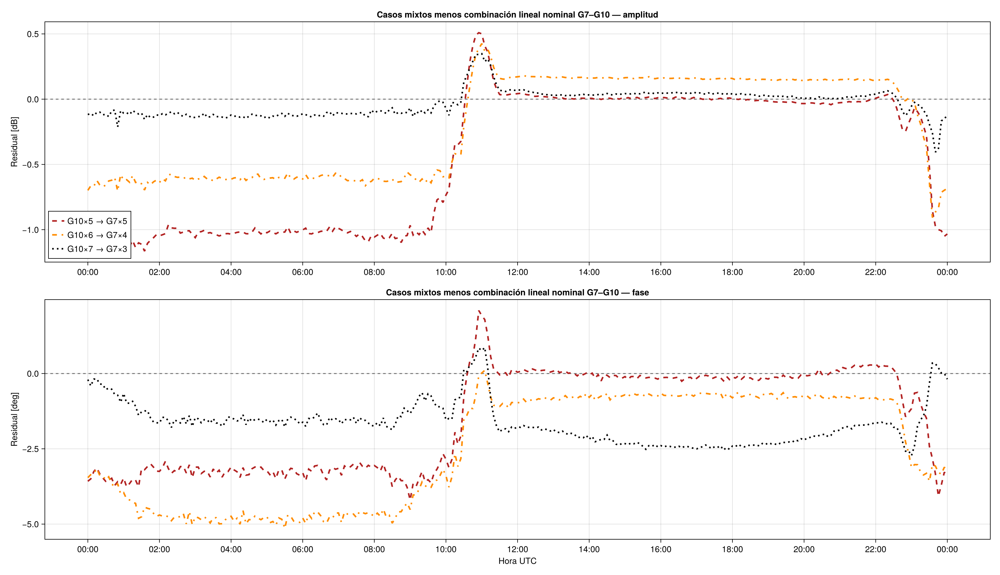

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/06_mixed_cases_residuals_from_nominal_linear_combination.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/06_mixed_cases_residuals_from_nominal_linear_combination.pdf")

In [13]:
################################################################################
# 13. Residuales de los casos mixtos frente a la combinación lineal nominal
################################################################################

fig_mixed_residuals = CM.Figure(size=(1650, 950))

ax_mix_res_A = CM.Axis(
    fig_mixed_residuals[1, 1],
    title = "Casos mixtos menos combinación lineal nominal G7–G10 — amplitud",
    ylabel = "Residual [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(ax_mix_res_A, [0.0], color=:gray45, linestyle=:dash)

ax_mix_res_phi = CM.Axis(
    fig_mixed_residuals[2, 1],
    title = "Casos mixtos menos combinación lineal nominal G7–G10 — fase",
    xlabel = "Hora UTC",
    ylabel = "Residual [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(ax_mix_res_phi, [0.0], color=:gray45, linestyle=:dash)

for key in mixed_keys
    i = case_index(key)
    α = mixed_ocean_fraction[key]

    A_linear =
        α .* A_dB[OCEAN_INDEX, :] .+
        (1 - α) .* A_dB[GOOD_SOIL_INDEX, :]

    phi_linear =
        α .* phi_unwrapped_deg[OCEAN_INDEX, :] .+
        (1 - α) .* phi_unwrapped_deg[GOOD_SOIL_INDEX, :]

    add_case_line!(
        ax_mix_res_A,
        t_hours,
        A_dB[i, :] .- A_linear,
        key;
        linewidth=2.6,
    )

    add_case_line!(
        ax_mix_res_phi,
        t_hours,
        phi_unwrapped_deg[i, :] .- phi_linear,
        key;
        linewidth=2.6,
    )
end

CM.axislegend(ax_mix_res_A, position=:lb)
CM.linkxaxes!(ax_mix_res_A, ax_mix_res_phi)
CM.xlims!(ax_mix_res_A, 0, 24)

paths_mixed_residuals = save_both(
    fig_mixed_residuals,
    "06_mixed_cases_residuals_from_nominal_linear_combination",
)

display(fig_mixed_residuals)
paths_mixed_residuals

In [14]:
################################################################################
# 14. Auditoría de continuidad temporal de la fase desenvuelta
################################################################################

phase_step_rows = NamedTuple[]

for i in 1:N_CASES
    steps = abs.(diff(vec(phi_unwrapped_deg[i, :])))
    max_step, local_index = findmax(steps)

    amplitude_min, amplitude_min_index = findmin(vec(A_dB[i, :]))

    push!(
        phase_step_rows,
        (
            case_key = case_keys[i],
            case_label = case_display[case_keys[i]],
            maximum_5min_phase_step_deg = max_step,
            time_of_maximum_phase_step_UTC = zdt[local_index + 1],
            close_to_unwrap_limit = max_step >= 150.0,
            minimum_amplitude_dB = amplitude_min,
            time_of_minimum_amplitude_UTC = zdt[amplitude_min_index],
        ),
    )
end

df_phase_step_audit = DataFrame(phase_step_rows)

CSV.write(
    joinpath(FIGURE_DIR, "phase_unwrap_step_audit.csv"),
    df_phase_step_audit,
)

display(df_phase_step_audit)

println(
    "\nCasos con un cambio de fase ≥150° en una muestra de 5 minutos:"
)

display(filter(
    :close_to_unwrap_limit => identity,
    df_phase_step_audit,
))

Row,case_key,case_label,maximum_5min_phase_step_deg,time_of_maximum_phase_step_UTC,close_to_unwrap_limit,minimum_amplitude_dB,time_of_minimum_amplitude_UTC
,String,String,Float64,ZonedDat…,Bool,Float64,ZonedDat…
1,ground_1,G1,49.5253,2008-03-25T23:00:00+00:00,false,1.14455,2008-03-25T11:20:00+00:00
2,ground_2,G2,65.7589,2008-03-25T23:30:00+00:00,false,5.12568,2008-03-25T11:30:00+00:00
3,ground_3,G3,77.4638,2008-03-25T10:55:00+00:00,false,-7.94476,2008-03-25T10:50:00+00:00
4,ground_4,G4,159.607,2008-03-25T23:10:00+00:00,true,25.8774,2008-03-25T23:05:00+00:00
5,ground_5,G5,170.737,2008-03-25T23:25:00+00:00,true,33.4166,2008-03-25T11:00:00+00:00
6,ground_6,G6,47.0019,2008-03-25T23:40:00+00:00,false,42.5491,2008-03-25T01:15:00+00:00
7,ground_7,G7 — buen suelo,48.1473,2008-03-25T23:40:00+00:00,false,45.3992,2008-03-25T08:40:00+00:00
8,ground_8,G8,48.2663,2008-03-25T23:40:00+00:00,false,46.8825,2008-03-25T10:55:00+00:00
9,ground_9,G9,47.6491,2008-03-25T23:40:00+00:00,false,46.7915,2008-03-25T10:55:00+00:00



Casos con un cambio de fase ≥150° en una muestra de 5 minutos:


Row,case_key,case_label,maximum_5min_phase_step_deg,time_of_maximum_phase_step_UTC,close_to_unwrap_limit,minimum_amplitude_dB,time_of_minimum_amplitude_UTC
,String,String,Float64,ZonedDat…,Bool,Float64,ZonedDat…
1,ground_4,G4,159.607,2008-03-25T23:10:00+00:00,true,25.8774,2008-03-25T23:05:00+00:00
2,ground_5,G5,170.737,2008-03-25T23:25:00+00:00,true,33.4166,2008-03-25T11:00:00+00:00


## Criterio de lectura de la auditoría de fase

`DSP.unwrap` elimina correctamente los saltos de rama después de disponer de la serie completa. Sin embargo, como cualquier procedimiento de unwrapping temporal, presupone que el cambio físico entre dos muestras sucesivas no supera el semiperíodo, es decir, aproximadamente \(180^\circ\).

Por eso, los casos cuyo cambio máximo en cinco minutos se acerca a \(180^\circ\) deben examinarse con precaución. Esto no prueba que el unwrapping sea incorrecto, pero indica que la cadencia de cinco minutos queda cerca del límite de identificación de rama durante una transición modal rápida.

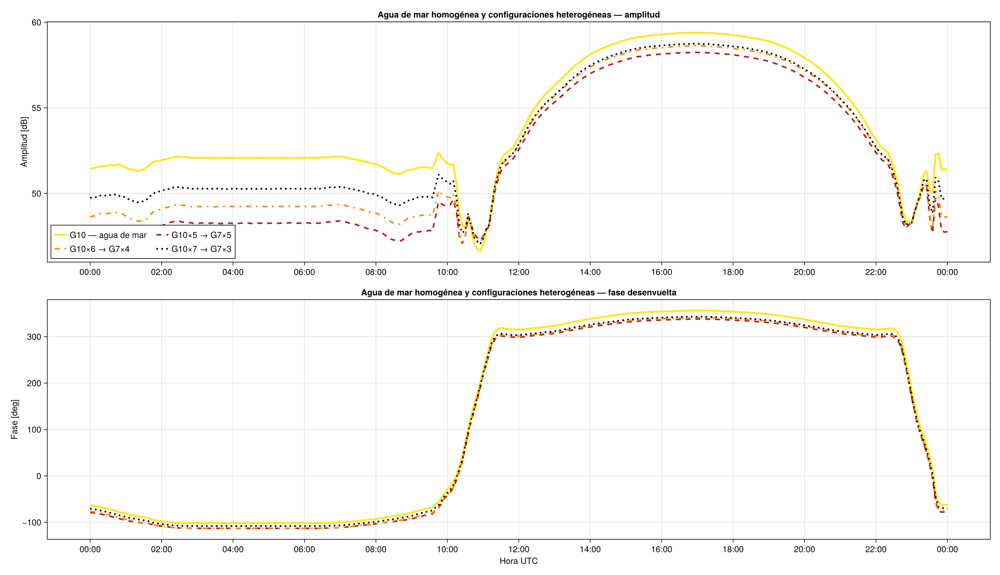

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/07_homogeneous_seawater_vs_heterogeneous_cases.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/07_homogeneous_seawater_vs_heterogeneous_cases.pdf")

In [15]:
################################################################################
# 15. Comparación exclusiva: agua de mar homogénea vs casos heterogéneos
################################################################################

comparison_heterogeneous_keys = [
    "ground_10",
    "ocean5_goodsoil5",
    "ocean6_goodsoil4",
    "ocean7_goodsoil3",
]

fig_heterogeneous_vs_ocean = CM.Figure(size=(1650, 950))

ax_heterogeneous_A = CM.Axis(
    fig_heterogeneous_vs_ocean[1, 1],
    title = "Agua de mar homogénea y configuraciones heterogéneas — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_hours, xtick_labels),
)

for key in comparison_heterogeneous_keys
    i = case_index(key)

    add_case_line!(
        ax_heterogeneous_A,
        t_hours,
        A_dB[i, :],
        key;
        linewidth = key == "ground_10" ? 3.2 : 2.7,
    )
end

CM.axislegend(
    ax_heterogeneous_A;
    position = :lb,
    nbanks = 2,
)

ax_heterogeneous_phi = CM.Axis(
    fig_heterogeneous_vs_ocean[2, 1],
    title = "Agua de mar homogénea y configuraciones heterogéneas — fase desenvuelta",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_hours, xtick_labels),
)

for key in comparison_heterogeneous_keys
    i = case_index(key)

    add_case_line!(
        ax_heterogeneous_phi,
        t_hours,
        phi_unwrapped_deg[i, :],
        key;
        linewidth = key == "ground_10" ? 3.2 : 2.7,
    )
end

CM.linkxaxes!(
    ax_heterogeneous_A,
    ax_heterogeneous_phi,
)

CM.xlims!(ax_heterogeneous_A, 0, 24)

paths_heterogeneous_vs_ocean = save_both(
    fig_heterogeneous_vs_ocean,
    "07_homogeneous_seawater_vs_heterogeneous_cases",
)

display(fig_heterogeneous_vs_ocean)

paths_heterogeneous_vs_ocean

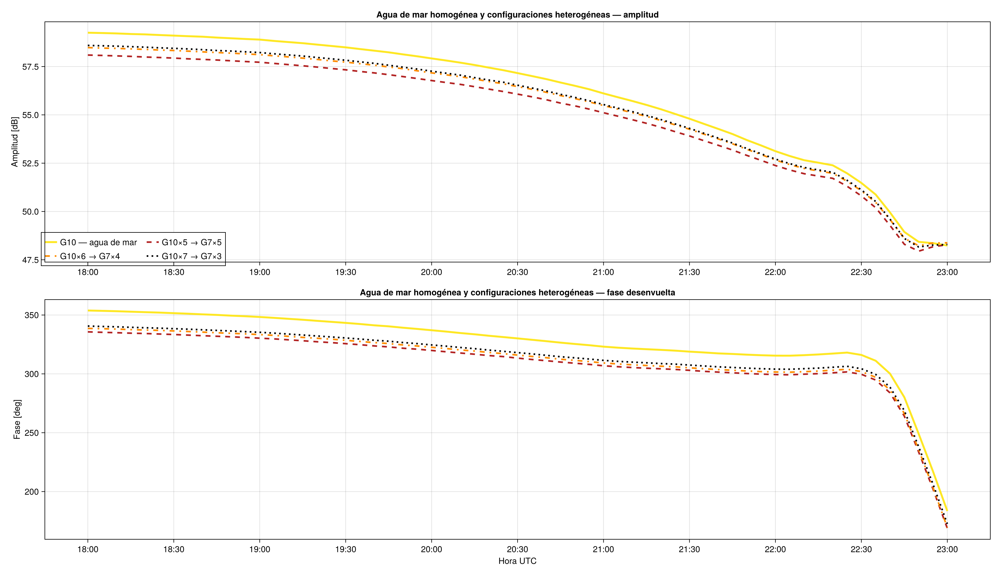

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/08_homogeneous_seawater_vs_heterogeneous_cases_18_23_UTC.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/08_homogeneous_seawater_vs_heterogeneous_cases_18_23_UTC.pdf")

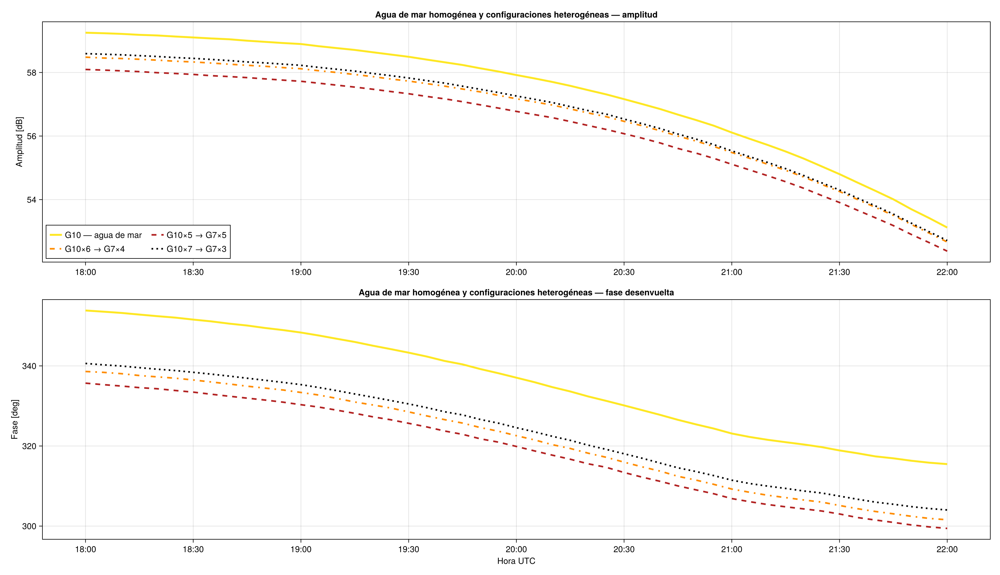

(png = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/08_homogeneous_seawater_vs_heterogeneous_cases_18_22_UTC.png", pdf = "/home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/visualization_reference_efield_firi_13ground_cases/08_homogeneous_seawater_vs_heterogeneous_cases_18_22_UTC.pdf")

In [17]:
################################################################################
# 16. Comparación exclusiva entre 18:00 y 22:00 UTC:
#     agua de mar homogénea vs casos heterogéneos
################################################################################

comparison_heterogeneous_keys = [
    "ground_10",
    "ocean5_goodsoil5",
    "ocean6_goodsoil4",
    "ocean7_goodsoil3",
]

window_start_18_22 = ZonedDateTime(
    2008,
    3,
    25,
    18,
    0,
    0,
    tz"UTC",
)

window_stop_18_22 = ZonedDateTime(
    2008,
    3,
    25,
    22,
    0,
    0,
    tz"UTC",
)

idx_18_22 = findall(
    t -> window_start_18_22 <= t <= window_stop_18_22,
    zdt,
)

isempty(idx_18_22) && error(
    "No se encontraron datos entre las 18:00 y las 22:00 UTC."
)

t_hours_18_22 = t_hours[idx_18_22]

xtick_hours_18_22 = collect(18.0:0.5:22.0)

xtick_labels_18_22 = [
    Dates.format(
        t0 + Minute(round(Int, 60h)),
        "HH:MM",
    )
    for h in xtick_hours_18_22
]

fig_heterogeneous_vs_ocean_18_22 = CM.Figure(
    size = (1650, 950),
)

ax_heterogeneous_A_18_22 = CM.Axis(
    fig_heterogeneous_vs_ocean_18_22[1, 1],
    title = "Agua de mar homogénea y configuraciones heterogéneas — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours_18_22,
        xtick_labels_18_22,
    ),
)

for key in comparison_heterogeneous_keys
    i = case_index(key)

    add_case_line!(
        ax_heterogeneous_A_18_22,
        t_hours_18_22,
        A_dB[i, idx_18_22],
        key;
        linewidth = key == "ground_10" ? 3.2 : 2.7,
    )
end

CM.axislegend(
    ax_heterogeneous_A_18_22;
    position = :lb,
    nbanks = 2,
)

ax_heterogeneous_phi_18_22 = CM.Axis(
    fig_heterogeneous_vs_ocean_18_22[2, 1],
    title = "Agua de mar homogénea y configuraciones heterogéneas — fase desenvuelta",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours_18_22,
        xtick_labels_18_22,
    ),
)

for key in comparison_heterogeneous_keys
    i = case_index(key)

    add_case_line!(
        ax_heterogeneous_phi_18_22,
        t_hours_18_22,
        phi_unwrapped_deg[i, idx_18_22],
        key;
        linewidth = key == "ground_10" ? 3.2 : 2.7,
    )
end

CM.linkxaxes!(
    ax_heterogeneous_A_18_22,
    ax_heterogeneous_phi_18_22,
)

CM.xlims!(
    ax_heterogeneous_A_18_22,
    18,
    22,
)

paths_heterogeneous_vs_ocean_18_22 = save_both(
    fig_heterogeneous_vs_ocean_18_22,
    "08_homogeneous_seawater_vs_heterogeneous_cases_18_22_UTC",
)

display(fig_heterogeneous_vs_ocean_18_22)

paths_heterogeneous_vs_ocean_18_22